**<h1> Pillow Library (PIL)</h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing, transmitting, and gathering images through the internet.

Python is an excellent choice as it has many image processing tools, computer vision and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and on the internet.

A digital image is simply a file in your computer. In this lab, you will gain an understanding of these files and learn to work with these files with the Pillow Library (PIL).


<ul>
    <li><a href='#PIL'>Python Image Libraries </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li> PIL Images into NumPy Arrays  </li>
        </ul>
    </li>
    
</ul>


----


Download the images for the lab:


In [52]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png

--2026-01-09 08:14:26--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.45.118.108
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.45.118.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 473831 (463K) [image/png]
Saving to: ‘lenna.png’

lenna.png           100%[===================>] 462.73K   779KB/s    in 0.6s    

2026-01-09 08:14:27 (779 KB/s) - ‘lenna.png’ saved [473831/473831]

--2026-01-09 08:14:27--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-course

Giải thích: Tải file ảnh lenna.png từ URL bằng lệnh wget, lưu với tên lenna.png trong thư mục hiện tại.

Giải thích: Tải thêm 2 ảnh baboon.png và barbara.png.



First, let's define a helper function to concatenate two images side-by-side. You will not need to understand the code below at this moment, but this function will be used repeatedly in this tutorial to showcase the results.


In [53]:
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

Giải thích: Tạo hàm để ghép 2 ảnh nằm ngang (side-by-side):

Image.new(): Tạo ảnh mới với kích thước bằng tổng chiều rộng 2 ảnh

dst.paste(): Dán ảnh đầu tiên tại vị trí (0,0), ảnh thứ hai bắt đầu từ chiều rộng của ảnh đầu

## Image Files and Paths  


An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [54]:
my_image = "lenna.png"

Giải thích: Gán tên file vào biến my_image.



A filename consists of two parts: the name of the file and the extension, separated by a full stop (`.`). The extension specifies the format of the Image. There are two popular image formats: Joint Photographic Expert Group image (or `.jpg`, `.jpeg`) and Portable Network Graphics (or `.png`). These file types make it simpler to work with images. For example, it compresses the image, taking less spaces on your drive to store the image.


Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory.


In [55]:
import os
cwd = os.getcwd()
cwd

'/content'

Giải thích:

import os: Import module để làm việc với hệ thống file

os.getcwd(): Lấy đường dẫn thư mục làm việc hiện tại

Kết quả: Trả về đường dẫn thư mục hiện tại

The "path" to an image can be found using the following line of code.


In [56]:
image_path = os.path.join(cwd, my_image)
image_path

'/content/lenna.png'

Giải thích:

os.path.join(): Nối đường dẫn thư mục với tên file

Tạo đường dẫn đầy đủ đến file ảnh

## Load Images in Python


Pillow (PIL) library is a popular library for loading images in Python. In addition, many other libraries such as "Keras" and "PyTorch" use this library to work with images. The `Image` module provides functions to load images from and saving images to the file system. Let's import it from `PIL`.


In [57]:
from PIL import Image

Giải thích: Import module Image từ thư viện PIL (Pillow).

If the image is in the current working directory, you can load the image as follows using the image's filename and create a PIL Image object:


In [58]:
image = Image.open(my_image)
type(image)

PIL.PngImagePlugin.PngImageFile

Giải thích:

Image.open(): Mở file ảnh, tạo đối tượng PIL Image

type(image): Kiểm tra kiểu đối tượng → PIL.PngImagePlugin.PngImageFile

If you are working in a Jupyter environment, you can view the image by calling the variable itself.  


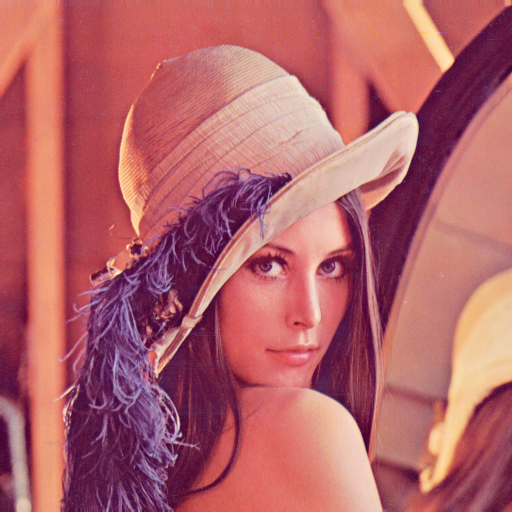

In [59]:
image

Giải thích: Trong Jupyter Notebook, gọi tên biến ảnh sẽ hiển thị ảnh trực tiếp.

##  Plotting an Image


We can also use the method `show` of PIL objects to display the image. Please note this method may or may not work depending on your setup.


In [60]:
image.show()

Giải thích: Mở ảnh bằng ứng dụng xem ảnh mặc định của hệ thống.

You can also use <code>imshow</code> method from the <code>matplotlib</code> library to display the image.


In [61]:
import matplotlib.pyplot as plt

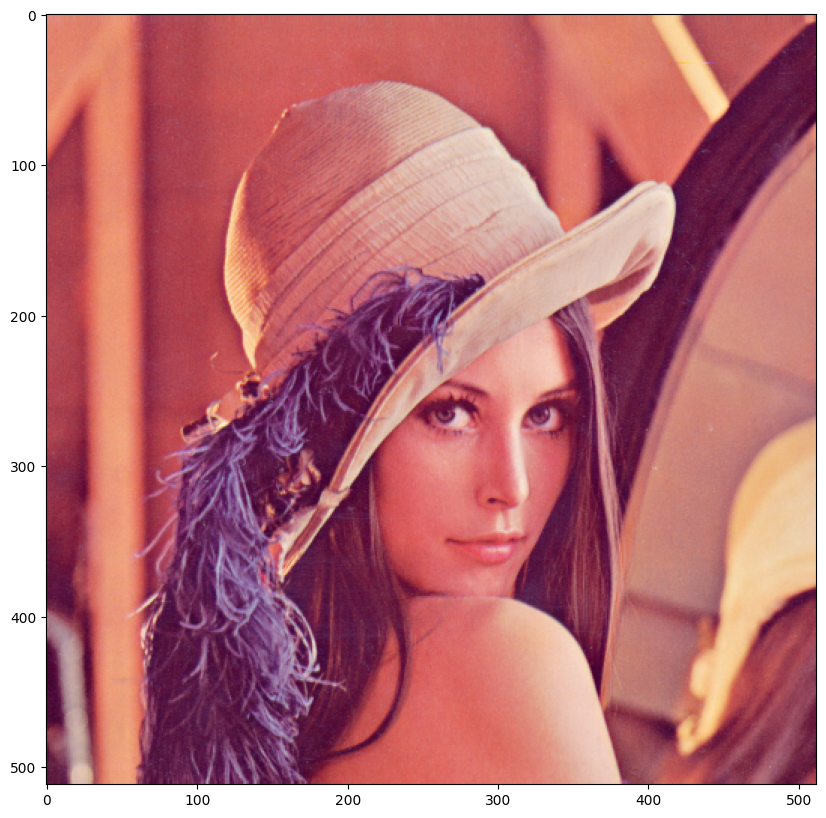

In [62]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

Giải thích:

import matplotlib.pyplot as plt: Import thư viện vẽ đồ thị

plt.figure(figsize=(10,10)): Tạo figure với kích thước 10x10 inch

plt.imshow(image): Hiển thị ảnh

plt.show(): Hiển thị figure

You can also load the image using its full path. This comes in handy if the image is not in your working directory.


In [63]:
image = Image.open(image_path)

We can use the attributes of the image object to get information. The attribute format is the extension or format of the image.


The attribute `size` returns a tuple, the first element is the number of pixels that comprise the width and the second element is the number of pixels that make up the height of the image.   


In [64]:
print(image.size)

(512, 512)


Giải thích: In kích thước ảnh (width, height) theo pixel.



This is a string specifying the pixel format used. In this case, it's “RGB”. RGB is a color space where red, green, and blue are added together to produce other colors.



In [65]:
print(image.mode)

RGB


Giải thích: In chế độ màu của ảnh (ví dụ: 'RGB', 'L' cho grayscale).



The `Image.open` method does not load image data into the computer memory. The `load` method of `PIL` object reads the file content, decodes it, and expands the image into memory.


In [66]:
im = image.load()

Giải thích: load() tải pixel data vào memory, trả về đối tượng PixelAccess.



We can then check the intensity of the image at the $x$-th column and $y$-th row:


In [67]:
x = 0
y = 1
im[y,x]

(226, 137, 125)

Giải thích: Truy cập giá trị màu tại vị trí (x=0, y=1). Chú ý: PIL dùng (x,y) nhưng khi index thì dùng [y,x].

We will use the array form to access the elements; it is slightly different.


You can save the image in `jpg` format using the following command.


In [68]:
image.save("lenna.jpg")

Giải thích: Lưu ảnh dưới định dạng JPG.



## Grayscale Images, Quantization and Color Channels  


### Grayscale Images


The `ImageOps` module contains several ‘ready-made’ image processing operations. This module is somewhat experimental, and most operators only work with grayscale and/or RGB images.


In [69]:
from PIL import ImageOps

Giải thích: Import module ImageOps chứa các operation xử lý ảnh.



Grayscale images have pixel values representing the amount of light or intensity of that pixel. Light shades of gray have a high-intensity while darker shades have a lower intensity, i.e, white has the highest intensity and black the lowest.


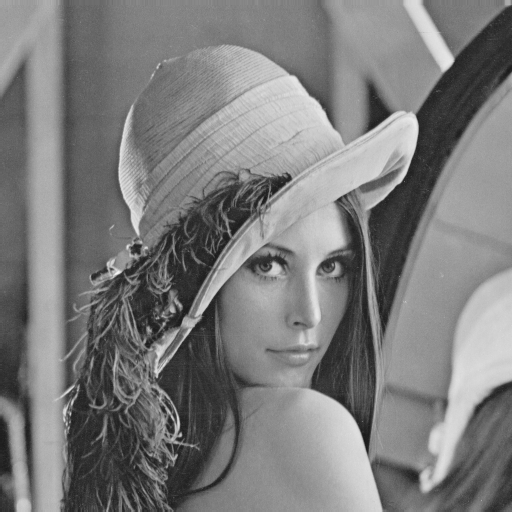

In [70]:
image_gray = ImageOps.grayscale(image)
image_gray

Giải thích: Chuyển ảnh màu thành ảnh grayscale.



The mode is `L` for grayscale.


In [71]:
image_gray.mode

'L'

Giải thích: Kiểm tra mode → 'L' (Luminance/grayscale).



### Quantization


The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method `quantize`. Let's repeatably cut the number of levels in half and observe what happens:


Half the levels do not make a noticable difference.


In [72]:
image_gray.quantize(256 // 2)
image_gray.show()

Let’s continue dividing the number of values by two and compare it to the original image.


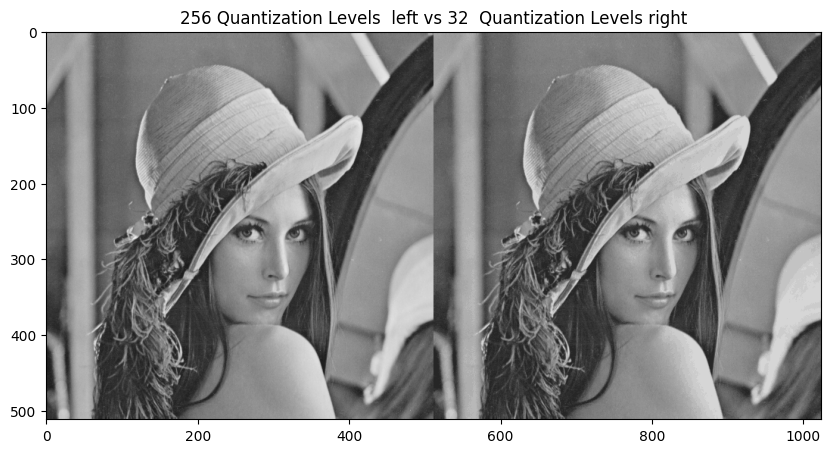

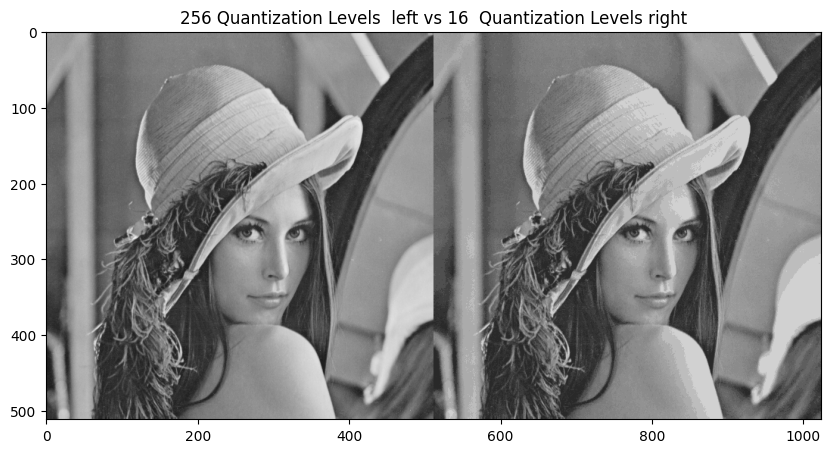

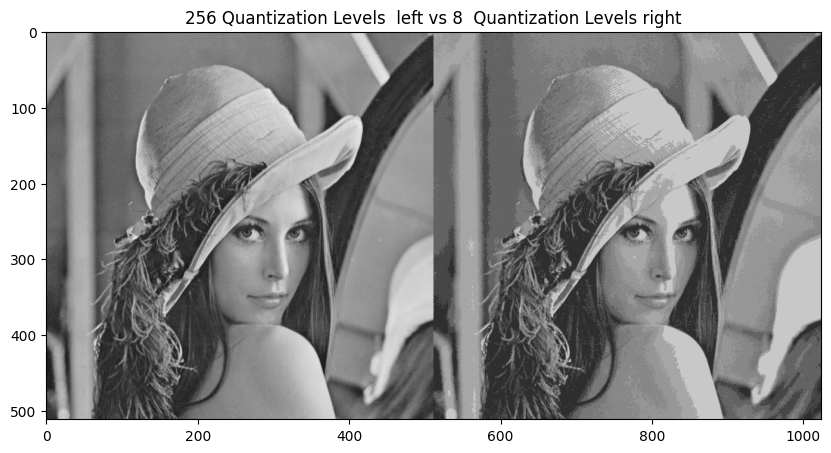

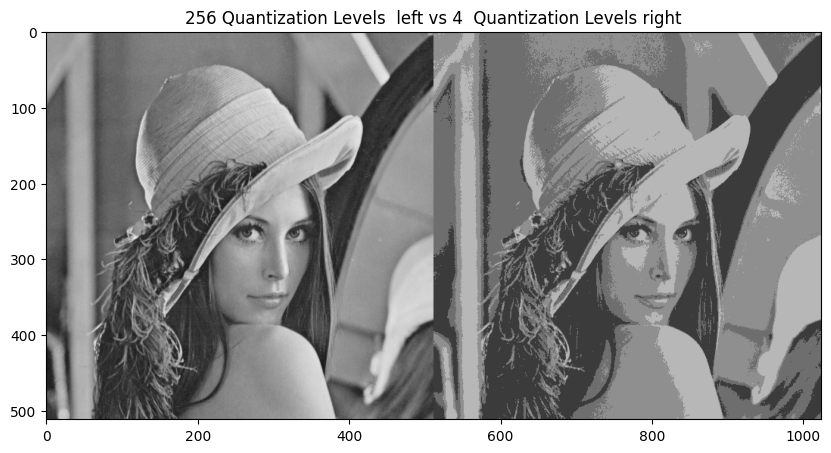

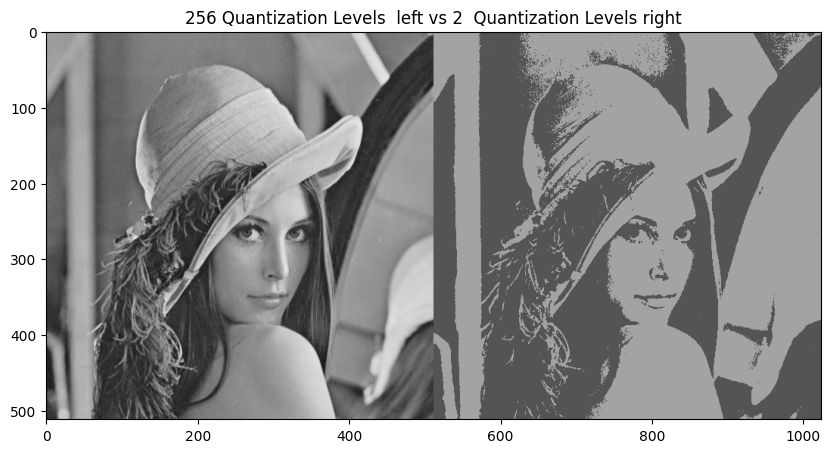

In [73]:
#get_concat_h(image_gray,  image_gray.quantize(256//2)).show(title="Lena")
for n in range(3,8):
    plt.figure(figsize=(10,10))

    plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n)))
    plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n))
    plt.show()

Giải thích: Vòng lặp giảm mức quantization:

quantize(256//2**n): Giảm số lượng màu từ 256 xuống 256/2^n

Hiển thị so sánh ảnh gốc (256 levels) vs ảnh giảm levels

### Color Channels  


We can also work with the different color channels. Consider the following image:


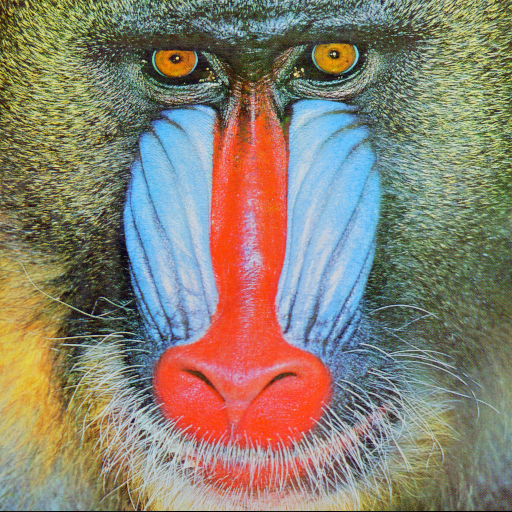

In [74]:
baboon = Image.open('baboon.png')
baboon

Giải thích: Mở ảnh baboon.



We can obtain the different RGB color channels and assign them to the variables <code>red</code>, <code>green</code>, and <code>blue</code>:


In [75]:
red, green, blue = baboon.split()

Giải thích: split() tách ảnh RGB thành 3 channel riêng biệt.



Plotting the color image next to the red channel as a grayscale, we see that regions with red have higher intensity values.


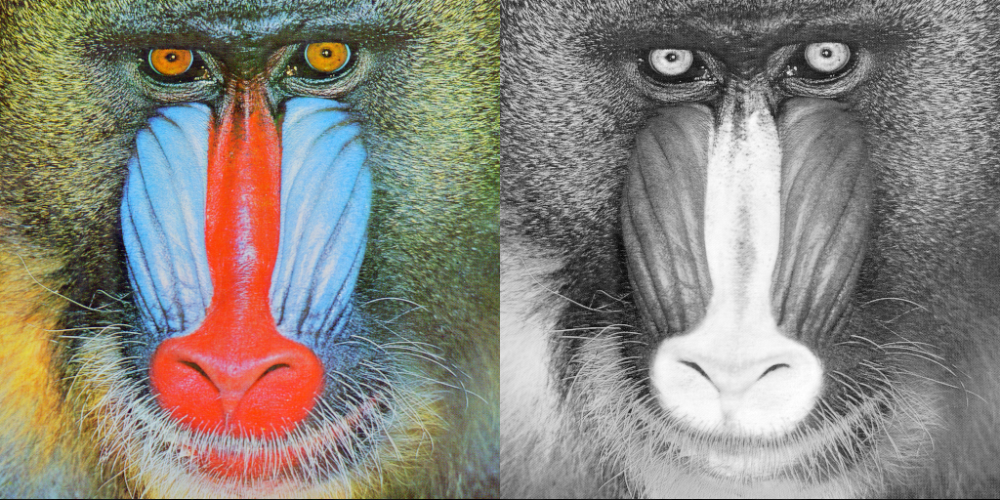

In [76]:
get_concat_h(baboon, red)

Giải thích: Ghép ảnh gốc với channel red (hiển thị dưới dạng grayscale).




We can do the same for the blue and green channels:


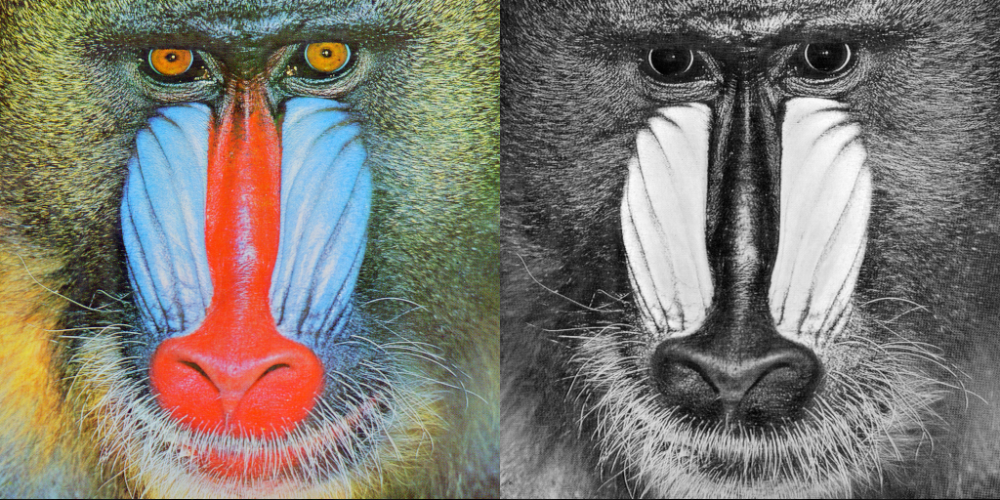

In [77]:
get_concat_h(baboon, blue)

Giải thích: Ghép ảnh gốc với channel blue (hiển thị dưới dạng grayscale).



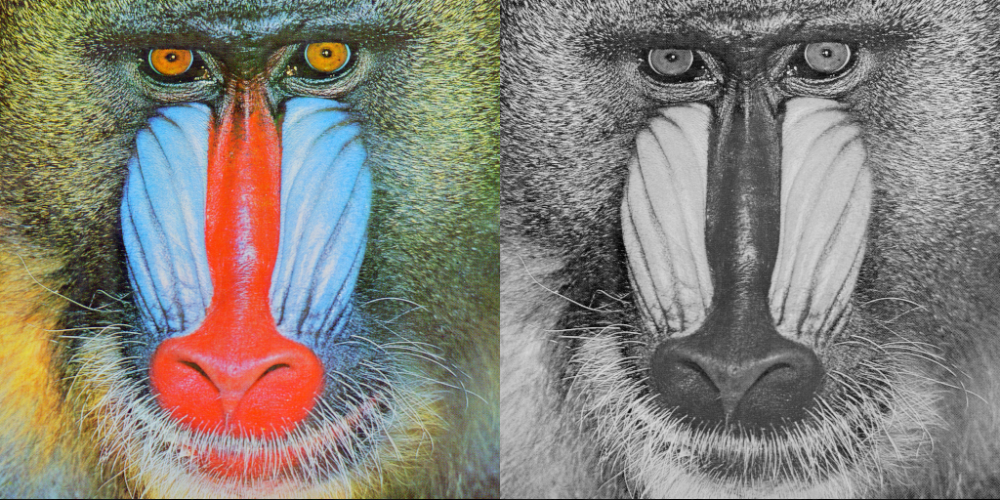

In [78]:
get_concat_h(baboon, green)

Giải thích: Ghép ảnh gốc với channel green (hiển thị dưới dạng grayscale).



## PIL Images into NumPy Arrays


NumPy is a library for Python, allowing you to work with multi-dimensional arrays and matrices. We can convert a PIL image to a NumPy array. We use <code>asarray()</code> or <code>array</code> function from NumPy to convert PIL images into NumPy arrays.

First, let's import the numpy module:


In [79]:
import numpy as np

Giải thích: Import thư viện NumPy.



We apply it to the <code>PIL</code> image we get a numpy array:


In [80]:
array= np.asarray(image)
print(type(array))

<class 'numpy.ndarray'>


Giải thích: Chuyển PIL Image thành NumPy array, kiểm tra type → numpy.ndarray.



`np.asarray` turns the original image into a numpy array. Often, we don't want to manipulate the image directly, but instead, create a copy of the image to manipulate. The `np.array` method creates a new copy of the image, such that the original one will remain unmodified.


In [81]:
array = np.array(image)

Giải thích: Tạo bản copy mới của ảnh dưới dạng NumPy array.



The attribute  <code>shape</code> of a `numpy.array` object returns a tuple corresponding to the dimensions of it, the first element gives the number of rows or height of the image,  the second is element is the number of columns or width of the image. The final element is the number of colour channels.


In [82]:
# summarize shape
print(array.shape)

(512, 512, 3)


Giải thích: In shape của array → (height, width, channels).



or <code>(rows, columns, colors)</code>. Each element in the color axis  corresponds to the following value  <code>(R, G, B)</code> format.


We can view the intensity values by printing out the array, they range from 0 to 255 or $2^{8}$ (8-bit).


In [83]:
print(array)

[[[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 ...

 [[ 84  18  60]
  [ 84  18  60]
  [ 92  27  58]
  ...
  [173  73  84]
  [172  68  76]
  [177  62  79]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]]


Giải thích: In toàn bộ array (rất lớn, hiển thị các giá trị pixel 0-255).



The Intensity values are  8-bit unsigned datatype.


In [84]:
array[0, 0]

array([226, 137, 125], dtype=uint8)

Giải thích: Truy cập pixel đầu tiên (hàng 0, cột 0), trả về tuple (R,G,B).



We can find the maximum and minimum intensity value of the array:      


In [85]:
array.min()

np.uint8(3)

In [86]:
array.max()

np.uint8(255)

Giải thích: Tìm giá trị nhỏ nhất và lớn nhất trong array.



### Indexing  


You can plot the array as an image:


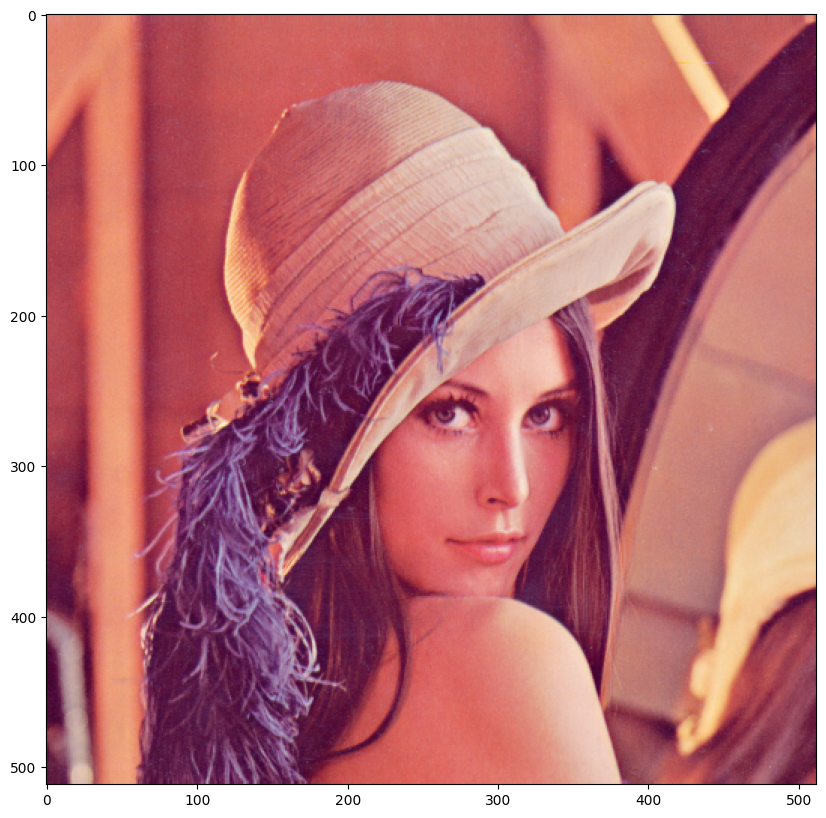

In [87]:
plt.figure(figsize=(10,10))
plt.imshow(array)
plt.show()

Giải thích:

plt.figure(figsize=(10, 10)): Tạo figure mới với kích thước 10x10 inch

plt.imshow(array): Hiển thị numpy array dưới dạng hình ảnh

plt.show(): Hiển thị plot

We can use numpy slicing, for example, we can return the first 256 rows corresponding to the top half of the image:


In [88]:
rows = 256

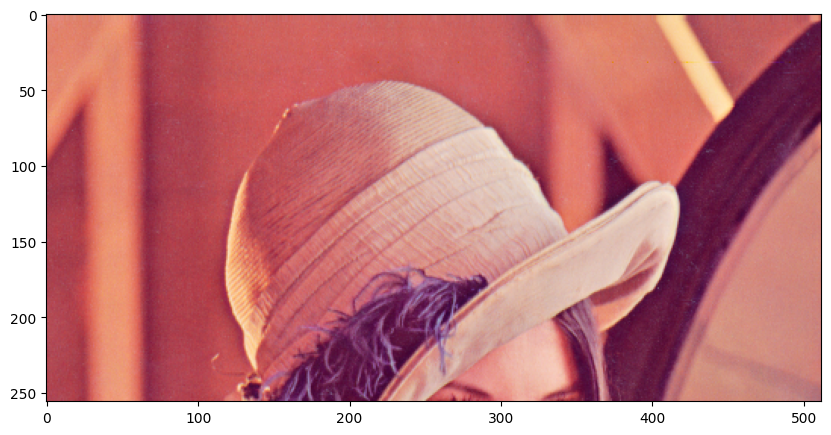

In [89]:
plt.figure(figsize=(10,10))
plt.imshow(array[0:rows,:,:])
plt.show()

Giải thích:

rows = 256: Định nghĩa số hàng muốn lấy

array[0:rows, :, :]: Cắt numpy array:

0:rows: Lấy từ hàng 0 đến hàng 255 (256 hàng đầu)

:: Giữ nguyên tất cả các cột

:: Giữ nguyên tất cả các kênh màu (RGB)

Đây là cách cắt phần trên cùng của ảnh

We can also return the first 256 columns corresponding to the first half of the image.


In [90]:
columns = 256

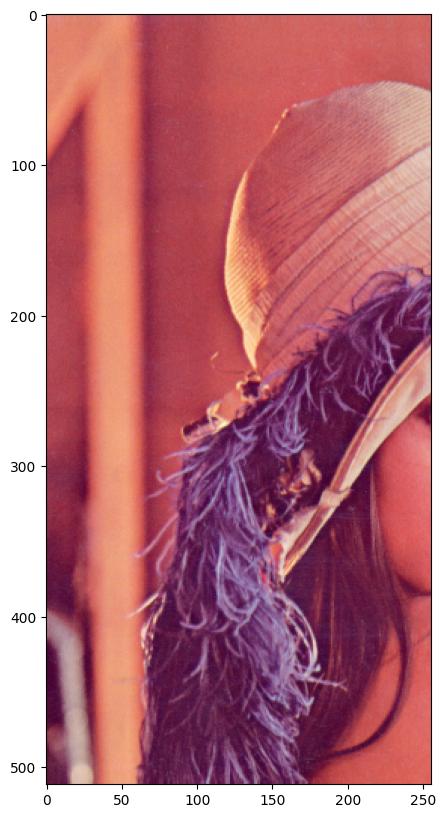

In [91]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,0:columns,:])
plt.show()

Giải thích:

columns = 256: Định nghĩa số cột muốn lấy

array[:, 0:columns, :]: Cắt numpy array:

:: Giữ nguyên tất cả các hàng

0:columns: Lấy từ cột 0 đến cột 255 (256 cột đầu)

:: Giữ nguyên tất cả các kênh màu

Đây là cách cắt nửa bên trái của ảnh

If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


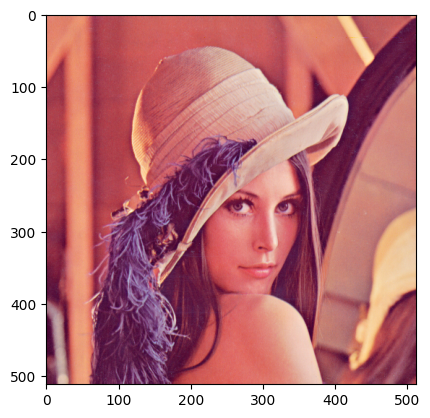

In [92]:
A = array.copy()
plt.imshow(A)
plt.show()

Giải thích:

A = array.copy(): Tạo bản sao độc lập của array gốc

Sử dụng copy() để đảm bảo khi thay đổi A sẽ không ảnh hưởng đến array gốc

Không có copy(), Python sẽ tạo reference (trỏ cùng vùng nhớ)

If we do not apply the method copy(), the variable will point to the same location in memory. Consider the array B. If we set all values of array A to zero, as B points to A, the values of B will be zero too:


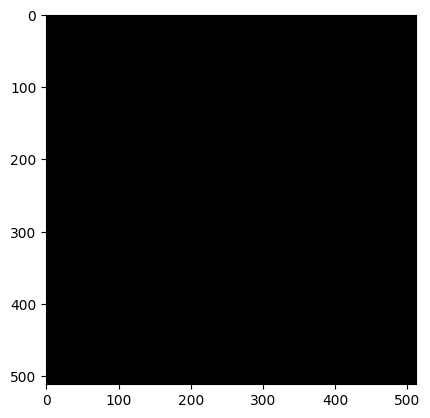

In [93]:
B = A
A[:,:,:] = 0
plt.imshow(B)
plt.show()

Giải thích:

B = A: Gán reference, cả B và A trỏ cùng memory location

A[:,:,:] = 0: Gán tất cả pixel thành 0 (màu đen)

B cũng thành đen vì cùng trỏ đến một vùng nhớ

We can also work with the different color channels. Consider the baboon image:


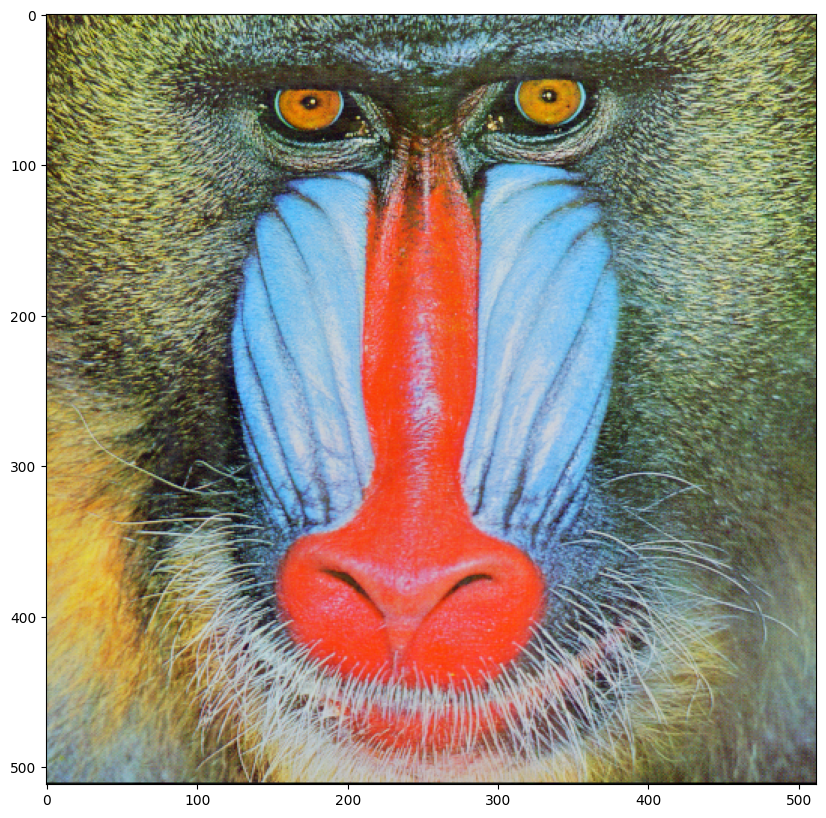

In [94]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array)
plt.show()

Giải thích:

[:,:,0]: Lấy channel red (index 0 trong RGB)

cmap='gray': Hiển thị dưới dạng grayscale

We can plot the red channel as intensity values of the red channel.


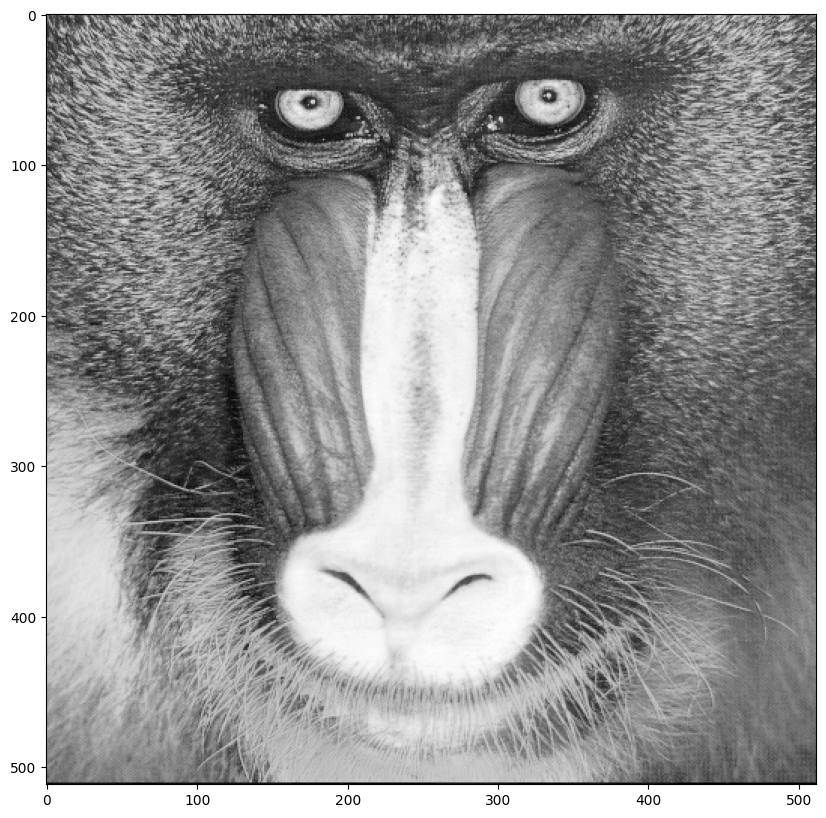

In [95]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0], cmap='gray')
plt.show()

Giải thích: Tạo ảnh chỉ có red channel bằng cách set green và blue về 0.



Or we can create a new array and set all but the red color channels to zero. Therefore, when we display the image it appears red:


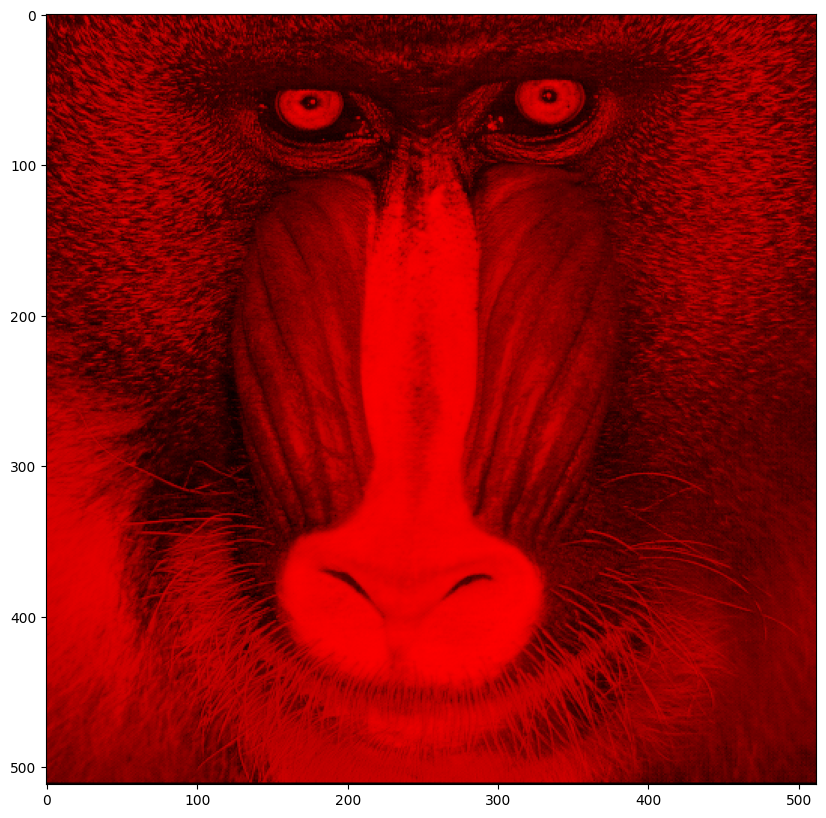

In [96]:
baboon_red=baboon_array.copy()
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_red)
plt.show()

Giải thích:

baboon_red = baboon_array.copy(): Tạo bản sao để không làm hỏng ảnh gốc

baboon_red[:,:,1] = 0: Đặt tất cả giá trị green channel (index 1) = 0

baboon_red[:,:,2] = 0: Đặt tất cả giá trị blue channel (index 2) = 0

Chỉ còn red channel (index 0) giữ nguyên → ảnh hiển thị màu đỏ

We can do the same for blue:


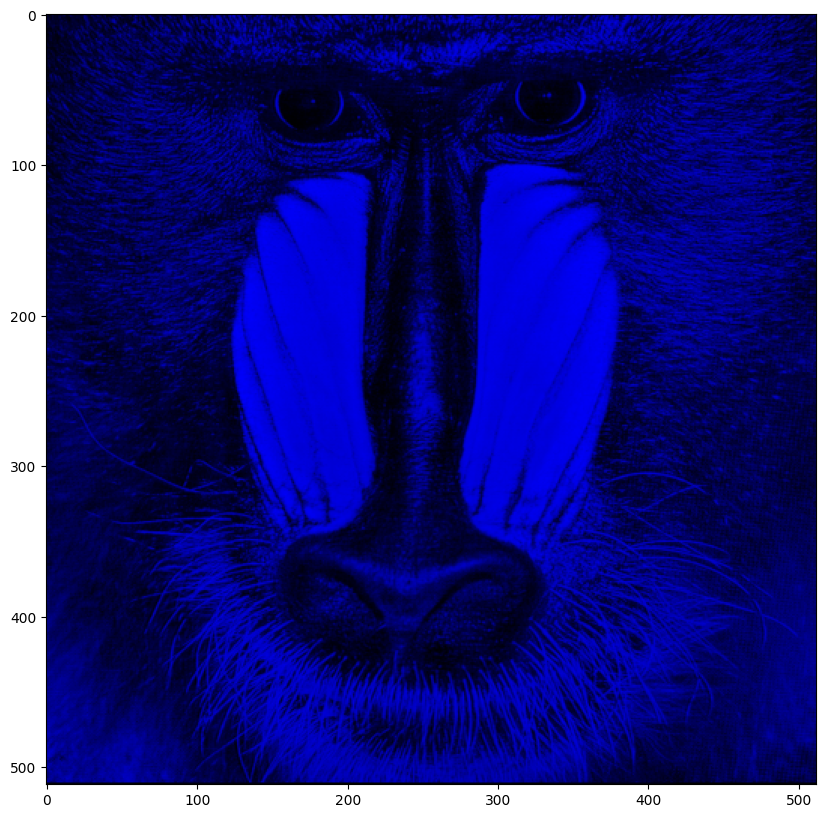

In [97]:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

Giải thích:

baboon_blue = baboon_array.copy(): Tạo bản sao

baboon_blue[:,:,0] = 0: Đặt red channel = 0

baboon_blue[:,:,1] = 0: Đặt green channel = 0

Chỉ còn blue channel (index 2) → ảnh hiển thị màu xanh dương

### Question 1:
Use the image `lenna.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `blue_lenna`, convert the image into a numpy array we can manipulate called `blue_array`, get the blue channel out of it, and finally plot the image


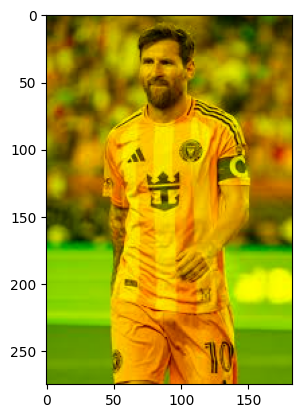

In [ ]:
# write your code here
image = Image.open('Messi.jpg')
# Convert the image into a numpy array
blue_array = np.array(image)
# Get the blue channel out of it
blue_array[:, :, 2] = 0

# Plot the image
plt.imshow(blue_array)
plt.show()

CƠ CHẾ HOẠT ĐỘNG:
Mở ảnh bằng PIL, tạo đối tượng Image

Chuyển sang mảng NumPy 3D với cấu trúc (height, width, 3 channels):

Channel 0: Red (Đỏ)

Channel 1: Green (Xanh lá)

Channel 2: Blue (Xanh dương)

Xử lý blue channel:

blue_array[:, :, 2] = 0 → Đặt TẤT CẢ giá trị trong kênh blue = 0

Kết quả: Ảnh mất hoàn toàn màu xanh dương

Hiển thị ảnh bằng matplotlib

Double-click **here** for a hint.

<!-- The hint is below:

blue_array[:,:,2] = 0

-->


Double-click **here** for the solution.

<!-- The answer is below:

blue_lenna = Image.open('lenna.png')
blue_array = np.array(blue_lenna)
blue_array[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(blue_array)
plt.show()

-->


# References


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).
